In [3]:
suppressMessages(library(tidyverse))
suppressMessages(library(parallel))
suppressMessages(library(Seurat))
suppressMessages(library(SeuratData))
suppressMessages(library(patchwork))
suppressMessages(library(Matrix))
suppressMessages(library(viridis))
suppressMessages(library(cowplot))
suppressMessages(library(ggsci))
suppressMessages(library(pheatmap))
suppressMessages(library(RColorBrewer))
suppressMessages(library(reshape2))
suppressMessages(library(LSD))
suppressMessages(library(readxl))
suppressMessages(library(ggrepel))
suppressMessages(library(randomForest))
suppressMessages(library(harmony))
options(future.globals.maxSize= 891289600 * 160)
# Plot each clusters
myHighlightDimPlot = function(seuratObj, highlightBy, size=1, alpha=1, showAllPoints=FALSE, ...) {
    umapTb = as_tibble(seuratObj@reductions$umap@cell.embeddings)
    if (!identical(rownames(seuratObj@reductions$umap@cell.embeddings), rownames(seuratObj@meta.data)))
        stop("Error: cell names not identical!")
    umapTb = cbind(umapTb, seuratObj@meta.data)
    highlightByClass = sort(unique(umapTb[[highlightBy]]))
    gpList = lapply(highlightByClass, function(cl) {
        subUmapTb = subset(umapTb, umapTb[[highlightBy]] == cl)
        if (showAllPoints) {
            gp = ggplot() + 
                geom_point(data=umapTb, aes(x=UMAP_1, y=UMAP_2), color="grey", shape=16, size=size, alpha=alpha) +
                geom_point(data=subUmapTb, aes(x=UMAP_1, y=UMAP_2), color="red", shape=16, size=size, alpha=alpha) +
                xlim(min(umapTb$UMAP_1), max(umapTb$UMAP_1)) +
                ylim(min(umapTb$UMAP_2), max(umapTb$UMAP_2)) +
                coord_fixed() +
                theme_void() 
        } else {
            gp = ggplot() + 
                geom_point(data=umapTb, aes(x=UMAP_1, y=UMAP_2), color="grey", shape=16, size=size, alpha=alpha) +
                geom_point(data=subUmapTb, aes(x=UMAP_1, y=UMAP_2), color="red", shape=16, size=size, alpha=alpha) +
                xlim(min(umapTb$UMAP_1), max(umapTb$UMAP_1)) +
                ylim(min(umapTb$UMAP_2), max(umapTb$UMAP_2)) +
                coord_fixed() +
                theme_void()
        }
        return(gp)
    })
    gpAll = plot_grid(plotlist=gpList, labels=highlightByClass, ...)
    return(gpAll)
}

In [ ]:
seurat1 = readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_1031_Insular/Insular_snrna_all_soupX_fil_batch1.rds')
seurat1$batch='batch1'
#http://localhost:1818/notebooks/spa_seurat/cla/speciesCompare/Insular_renew_1016/compare_to_Insular/ma_fas_V2_snRNA_data/post_compare_analysis/2文库过滤.ipynb
seurat2=readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_1031_Insular/Insular_snrna_all_soupX_fil_batch2_1016.rds')
seurat2$batch='batch2'
#http://localhost:1818/notebooks/spa_seurat/cla/speciesCompare/Insular_renew_1016/data_preprocess/2文库过滤.ipynb
seurat2@meta.data[grep('0613',seurat2@meta.data$group),]$batch='batch3'

classFiltSeurat=merge(seurat1,seurat2)

classFiltSeurat

classFiltSeurat = SCTransform(
classFiltSeurat, assay="RNA",
ncells=ncol(classFiltSeurat[["RNA"]]),
variable.features.n=5000,
return.only.var.genes = T,
vars.to.regress="percent.mt",
method="glmGamPoi"
)
classFiltSeurat = classFiltSeurat %>%
RunPCA(npcs=100, verbose = FALSE) %>%
FindNeighbors(dims = 1:50) %>%
FindClusters(verbose = FALSE) %>%
RunUMAP(dims = 1:50)
saveRDS(classFiltSeurat,'/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_1031_Insular/Insular_snrna_all_soupX_fil_batch12_1016_SCT.rds')



In [2]:

seurat=readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_1031_Insular/Insular_snrna_all_soupX_fil_batch12_1016_SCT.rds')


In [3]:
seurat
sum(table(seurat$group))
table(seurat$group)

An object of class Seurat 
45543 features across 151539 samples within 2 assays 
Active assay: SCT (22313 features, 5000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

[1] 151539


    6121-1     6121-2     6157-1     6157-2     6161-1     6161-2     6460-1 
      7460       7134       1251       2528       4032       3629        497 
    6460-2  86_LC0613  87_LC0613  88_LC0613  89_LC0613  90_LC0613 MQ277R-301 
      2069      23710      16134      14483       7903      19573      13341 
MQ277R-320 MQ277R-376 
     15910      11885 

In [4]:
seurat$sample='test'
all_n=unique(seurat$group)
name1=all_n[grep('LC0613',all_n)]
name2=all_n[grep('MQ277R',all_n)]
name3=setdiff(all_n,c(name1,name2))
name1
name2
name3
seurat@meta.data[seurat@meta.data$group %in% name1,]$sample='MQ121'
seurat@meta.data[seurat@meta.data$group %in% name2,]$sample='MQ277'
seurat@meta.data[seurat@meta.data$group %in% name3,]$sample='MQC286'
sum(table(seurat$sample))
table(seurat$sample)


[1] "86_LC0613" "87_LC0613" "88_LC0613" "89_LC0613" "90_LC0613"

[1] "MQ277R-301" "MQ277R-320" "MQ277R-376"

[1] "6121-1" "6121-2" "6157-1" "6157-2" "6161-1" "6161-2" "6460-1" "6460-2"

[1] 151539


 MQ121  MQ277 MQC286 
 81803  41136  28600 

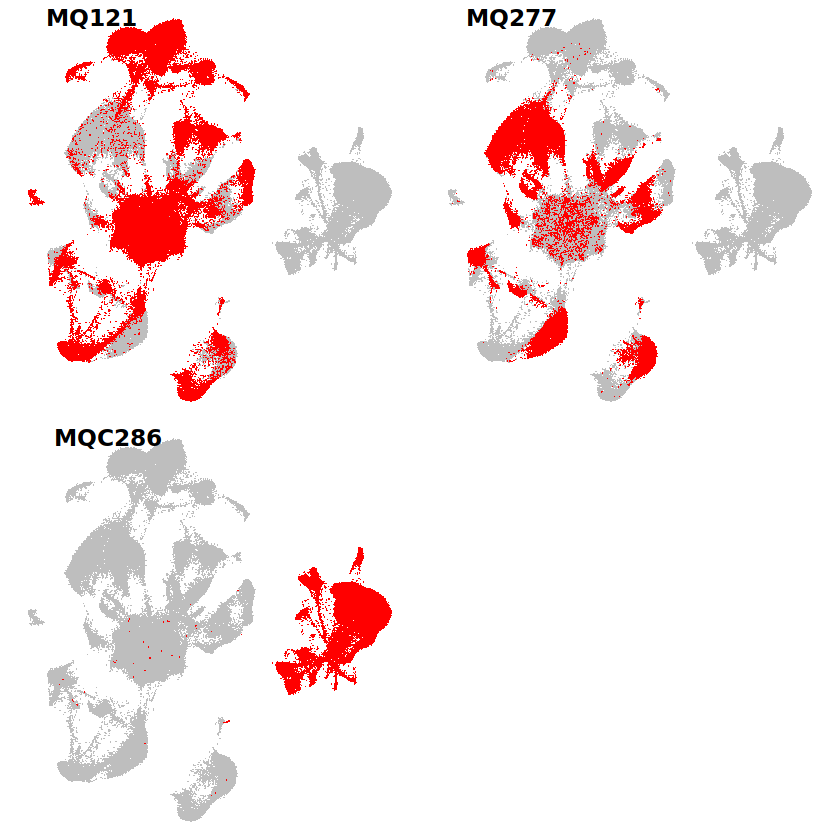

In [5]:
options(repr.plot.width=7, repr.plot.height=7)
myHighlightDimPlot(seurat, highlightBy="sample", showAllPoints=T, size=0.1)

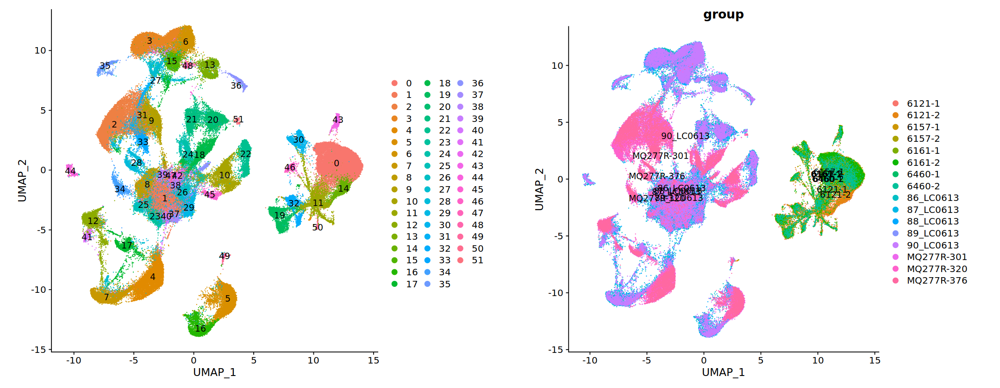

In [6]:
options(repr.plot.width=18, repr.plot.height=7)
plot_grid(
    DimPlot(seurat, reduction="umap", label=T,raster=FALSE)+coord_fixed(),
    #DimPlot(seurat, reduction="umap", group.by="sampleId", label=T)+coord_fixed(),
    DimPlot(seurat, reduction="umap", group.by="group", label=T,raster=FALSE)+coord_fixed(),
    nrow=1
)

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 7576950)”
Harmony 1/10

Harmony 2/10

Harmony converged after 2 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.harmony; see ?make.names for more details on syntax validity”
Computing nearest neighbor graph

Computing SNN

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
14:29:18 UMAP embedding parameters a = 0.9922 b = 1.112

14:29:18 Read 151539 rows and found 50 numeric columns

14:29:18 Using Annoy for neighbor search, n_neighbors = 30

14:29:18 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|---

An object of class Seurat 
45543 features across 151539 samples within 2 assays 
Active assay: SCT (22313 features, 5000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

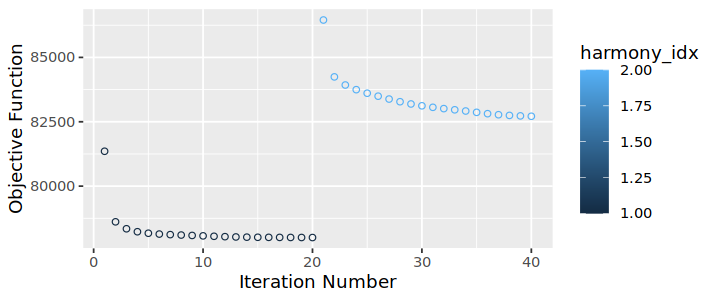

In [7]:
classFiltSeurat=seurat
# Run harmony
DefaultAssay(classFiltSeurat) = "SCT"
options(repr.plot.width=6, repr.plot.height=2.5)
classFiltSeurat = RunHarmony(
classFiltSeurat, group.by.vars="sample", plot_convergence=T,
assay.use="SCT", reduction = "pca", dims.use=1:50
)
classFiltSeurat = classFiltSeurat %>%
FindNeighbors(reduction="harmony", dims = 1:50) %>%
FindClusters(verbose = FALSE) %>%
RunUMAP(reduction="harmony", dims = 1:50)
return(classFiltSeurat)


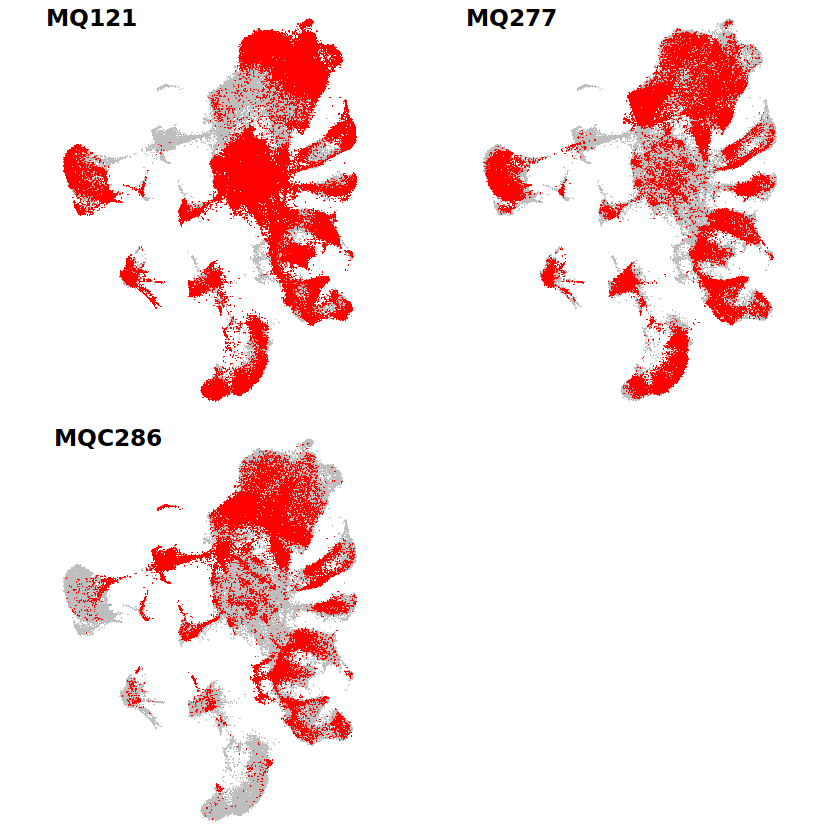

In [8]:
options(repr.plot.width=7, repr.plot.height=7)
myHighlightDimPlot(classFiltSeurat, highlightBy="sample", showAllPoints=T, size=0.1)
        

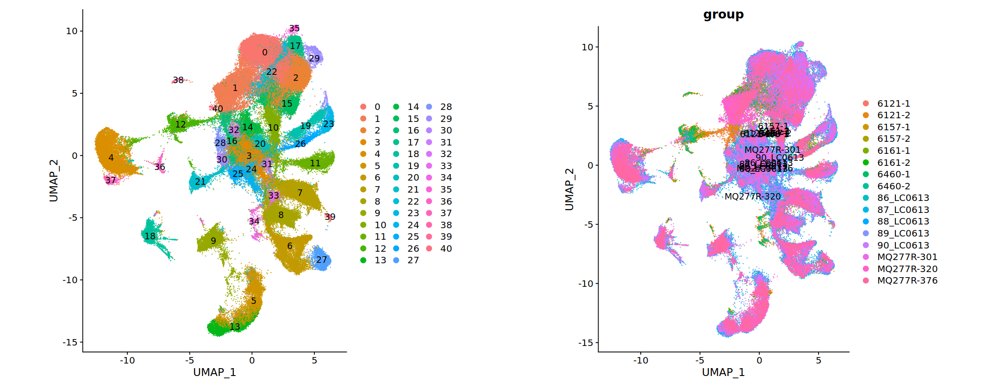

In [9]:
seurat=classFiltSeurat
options(repr.plot.width=18, repr.plot.height=7)
plot_grid(
    DimPlot(seurat, reduction="umap", label=T,raster=FALSE)+coord_fixed(),
    #DimPlot(seurat, reduction="umap", group.by="sampleId", label=T)+coord_fixed(),
    DimPlot(seurat, reduction="umap", group.by="group", label=T,raster=FALSE)+coord_fixed(),
    nrow=1
)

Warning message in FetchData.Seurat(object = object, vars = features, cells = cells):
“The following requested variables were not found: DLX6-AS1, GJA1, ZMYDN10, ALPHA-SMA, PDGFRALPHA, VECAD, CD105, COX4l2, MOTCH3, CS3CR1”


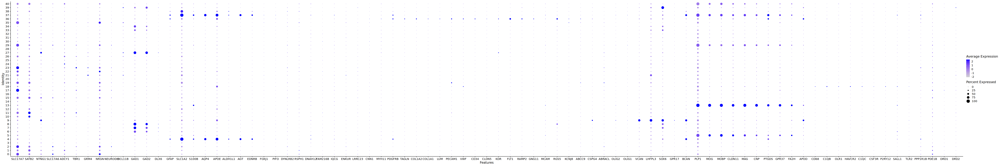

In [10]:
selectMarkers = c(
    "SLC17A7","SATB2",'NTNG1','SLC17A6','ADCY1','TBR1','GRM4','NRGN','NEUROD6','BCL11B', # Excit
    "GAD1", "GAD2",'DLX6','DLX6-AS1', # Inhib,
    "GFAP", "SLC1A2", "SLC1A2", "S100B", "AQP4", "APOE",'GJA1','ALDH1L1','AGT','EDNRB', # Astrocytes
    "FOXJ1", "PIFO", "DYNLRB2", "RSPH1", "DNAH12", "FAM216B", "ZMYDN10", "IQCG", "ENKUR","LRRC23", # Ependymal
    "CNN1", "MYH11", "PDGFRB", "TAGLN", "ALPHA-SMA", # VSMC
    "COL1A2", 'COL1A1','LUM','PDGFRALPHA',# VLMC
    "PECAM1","VWF","CD34","VECAD" ,"CLDN5","KDR","CD105",'FLT1','RAMP2','GNG11',# Endotheial
    "PDGFRB", "MCAM", "RGS5", "ALPHA-SMA", "KCNJ8",'TAGLN','COX4l2','MOTCH3','ABCC9','CSPG4', # Pericytes
    "ABRACL", "PDGFRALPHA", "OLIG2", "CSPG4", "OLIG1", "VCAN",'LHFPL3','SOX6','GPR17','BCAN', # OPC
    "PLP1",'MOG','MOBP','CLDN11','MAG','CNP','PTGDS','GPR37','FA2H','APOD', # Oligo
    'CD68','C1QB','OLR1','HAVCR2','C1QC','CSF3R','CS3CR1','P2RY12','SALL1','TLR2',# Microglia
    'PPP1R1B','BCL11B','PDE1B','DRD1','DRD2'
)



selectMarkers=selectMarkers

selectMarkers=selectMarkers[!duplicated(selectMarkers)]
Idents(seurat) = "seurat_clusters"
options(repr.plot.height=10,repr.plot.width=60)
DotPlot(seurat, features = selectMarkers)




In [61]:
    marker=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_1031/dif_res_anno1/train_seurat/train_res1.1_res0.9_res0.15_downsample3000_supercluster_marker.csv')
    sel_type=setdiff(unique(marker$cluster),unique(marker$cluster)[grep('EX',unique(marker$cluster))])
    marker1=marker[marker$cluster %in% sel_type,]

    marker=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/dif_res_anno/marker_Compare.csv')
    all_n=unique(marker$cluster)
    sel=all_n[grep('L[0-9]',all_n)]
    marker2=marker[marker$cluster %in% sel,]

    marker1=marker1[,c('cluster','gene','avg_log2FC','p_val_adj')]
    marker2=marker2[,c('cluster','gene','avg_log2FC','p_val_adj')]
    marker=rbind(marker1,marker2)
    marker=marker[marker$cluster %in% setdiff(unique(marker$cluster),c('OPC','MSN','Endotheial','Microglia',
                                                                      'Astrocytes','Oligo')),]
    marker$renew_name=paste0(marker$cluster,'_',marker$gene)
    marker=marker[!duplicated(marker$renew_name),]

    sort_marker=marker %>% group_by(cluster) %>% top_n(n=20,wt=avg_log2FC)



In [62]:
unique(sort_marker$cluster)

[1] "IN_LAMP5"     "IN_RELN"      "IN_PVALB"     "IN_VIP"       "IN_CHC"      
 [6] "IN_SST"       "L2/3 IT"      "L4 IT"        "L5 ET"        "L5 IT"       
[11] "L5/6 NP"      "L6 CT"        "L6 IT"        "L5/6 IT Car3" "L6b"

In [63]:
sort_marker[sort_marker$cluster=='L6b',]$gene

[1] "ADAMTSL1"      "C10orf11"      "DGKG"          "DLC1"         
 [5] "HS3ST4"        "KIAA1217"      "NFIA"          "POU6F2"       
 [9] "RP11-286B14.1" "RP11-420N3.3"  "RP11-454P21.1" "SLIT3"        
[13] "ZFHX3"         "AC087565.3"    "AL356479.1"    "CCBE1"        
[17] "LOC401134"     "PDZRN4"        "THSD4"         "LOC706619"

In [64]:
sort_marker[sort_marker$cluster=='L5 ET',]$gene

[1] "ASIC2"         "CABP1"         "CBLN2"         "COL5A2"       
 [5] "ERG"           "ESRRG"         "FAM19A1"       "GRM8"         
 [9] "GULP1"         "HTR2C"         "HTR4"          "NRG1"         
[13] "RIT2"          "RP11-624C23.1" "SLIT3"         "AC113137.1"   
[17] "AC120193.1"    "LOC105378657"  "LOC114680581"  "TAFA1"

In [66]:
sort_marker[sort_marker$cluster=='L5/6 NP',]$gene

[1] "AC006227.1"   "AC096669.2"   "ASIC2"        "GHR"          "HS3ST4"      
 [6] "HTR2C"        "ITGA8"        "NPSR1-AS1"    "RP11-420N3.3" "TLE4"        
[11] "TLL1"         "ZNF385D"      "LINC01811"    "LINC02388"    "LOC101928095"
[16] "LOC645544"    "LOC729732"    "NPSR1"        "CORIN"        "LOC706619"

Warning message in FetchData.Seurat(object = object, vars = features, cells = cells):
“The following requested variables were not found (10 out of 28 shown): C10ORF11, DLC1, RP11-286B14.1, RP11-420N3.3, RP11-454P21.1, AC087565.3, AL356479.1, LOC401134, LOC706619, AC011288.2”


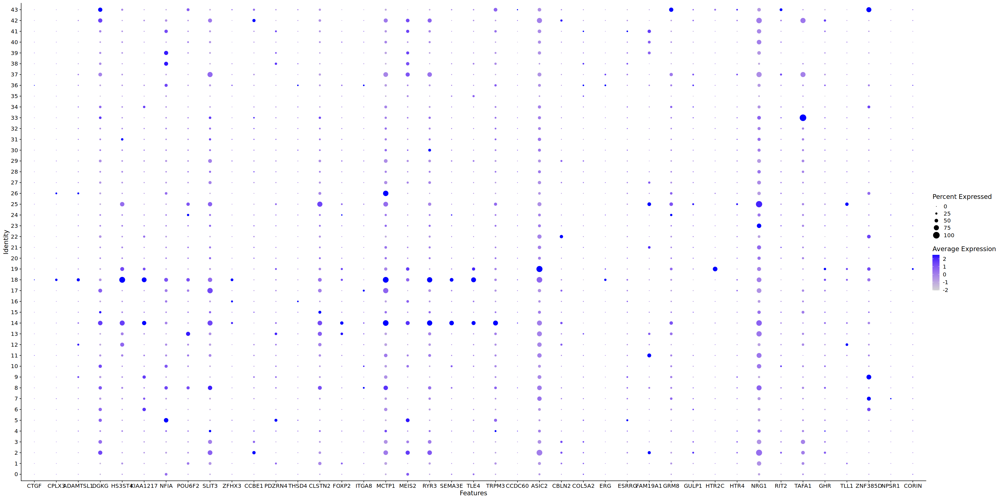

In [65]:
selectMarkers = c(
"CTGF", "Cplx3", # L6b
    sort_marker[sort_marker$cluster=='L6b',]$gene,#L56NP
    sort_marker[sort_marker$cluster=='L6 CT',]$gene,#L56NP
    sort_marker[sort_marker$cluster=='L5 ET',]$gene,
    sort_marker[sort_marker$cluster=='L5/6 NP',]$gene
)

selectMarkers=toupper(selectMarkers)


selectMarkers=selectMarkers[!duplicated(selectMarkers)]
Idents(seurat) = "seurat_clusters"
options(repr.plot.height=15,repr.plot.width=30)
DotPlot(seurat, features = selectMarkers)




In [14]:
seurat@meta.data$class='Uncertain'
seurat@meta.data[seurat@meta.data$seurat_clusters %in% c(0,1,2,22,17,29,15,17,35,10,19,
                                                        23,26,11,21),]$class='Excit_Neuron'
seurat@meta.data[seurat@meta.data$seurat_clusters %in% c(6,7,8,27),]$class='Inhibit_Neuron'
seurat@meta.data[seurat@meta.data$seurat_clusters %in% c(4),]$class='Astrocytes'
seurat@meta.data[seurat@meta.data$seurat_clusters %in% c(5,13),]$class='Oligo'
seurat@meta.data[seurat@meta.data$seurat_clusters %in% c(36),]$class='Endotheial'
seurat@meta.data[seurat@meta.data$seurat_clusters %in% c(9),]$class='OPC'
seurat@meta.data[seurat@meta.data$seurat_clusters %in% c(18),]$class='Microglia'




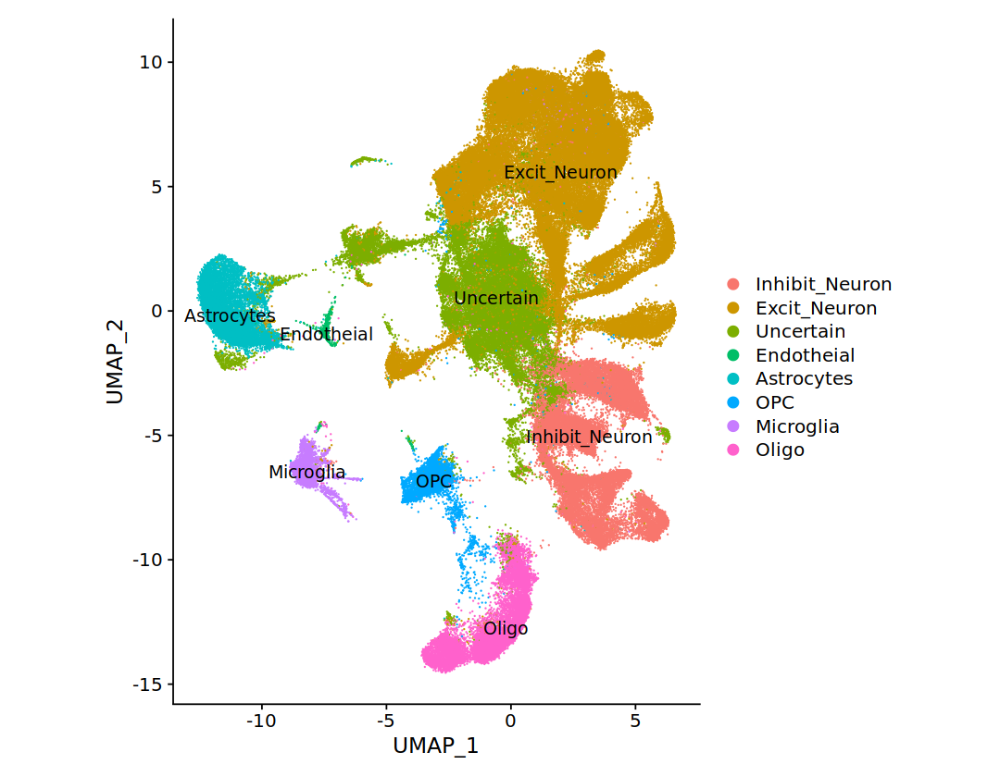

In [15]:
Idents(seurat) = "class"
options(repr.plot.width=9, repr.plot.height=7)
DimPlot(seurat, reduction="umap", label=T,raster=FALSE)+coord_fixed()


Joining, by = "cell"


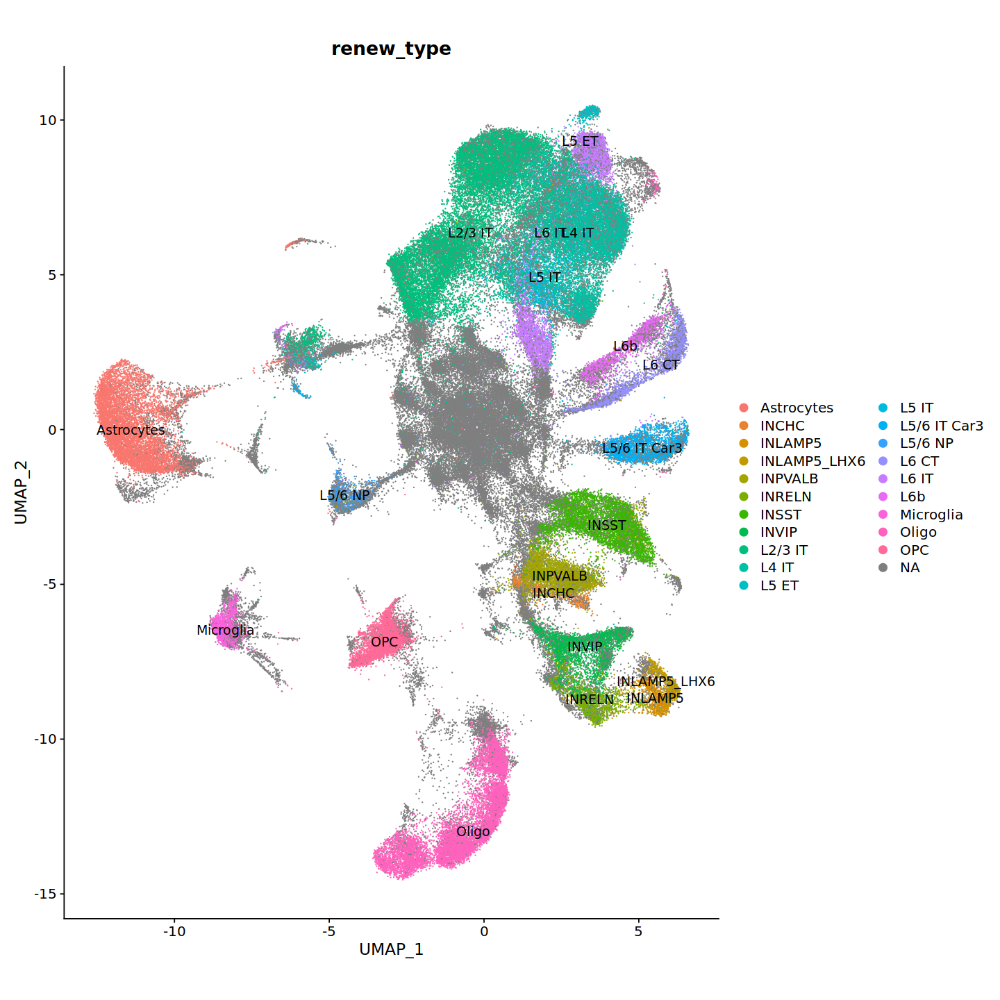

In [13]:
df=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/ref_insu.csv')

ref=seurat@meta.data
ref$cell=rownames(ref)
ref=left_join(ref,df)
seurat=AddMetaData(seurat,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(seurat,group.by = 'renew_type',label=T,raster=FALSE)+coord_fixed()



In [16]:
# 每个class抽样80%，最多500个细胞
sampleRatio = 0.8
maxCell = 5000
sampleDf = seurat@meta.data[, c("class"), drop=F]
sampleList = split(sampleDf, sampleDf$class)
sampleList = lapply(sampleList, function(x) {
    sampleSize = as.integer(nrow(x)*0.8)
    if (sampleSize > maxCell) {
        sampleSize = maxCell
    }
    sampleIdx = 1:nrow(x)
    sampleIdx = sample(1:nrow(x), size=sampleSize, replace=F)
    return(x[sampleIdx,,drop=F])
})
sampleDf = Reduce(rbind, sampleList)
str(sampleDf)
table(sampleDf$class)

trainSeurat = seurat[,rownames(sampleDf)]
table(trainSeurat$class)

'data.frame':	32173 obs. of  1 variable:
 $ class: chr  "Astrocytes" "Astrocytes" "Astrocytes" "Astrocytes" ...



    Astrocytes     Endotheial   Excit_Neuron Inhibit_Neuron      Microglia 
          5000            426           5000           5000           2651 
         Oligo            OPC      Uncertain 
          5000           4096           5000 


    Astrocytes     Endotheial   Excit_Neuron Inhibit_Neuron      Microglia 
          5000            426           5000           5000           2651 
         Oligo            OPC      Uncertain 
          5000           4096           5000 

In [17]:
Idents(trainSeurat) = "class"
classMarker = FindAllMarkers(trainSeurat)
#write_tsv(classMarker, paste0(dataDir, "/allSnRNAseq.soupx.mergeSeuratFiltlibFilt800mt5Ratio1d2.downsample5000ClassMarker.20220822.tsv"))


Calculating cluster Astrocytes

Calculating cluster Endotheial

Calculating cluster Excit_Neuron

Calculating cluster Inhibit_Neuron

Calculating cluster Microglia

Calculating cluster Oligo

Calculating cluster OPC

Calculating cluster Uncertain




    Astrocytes     Endotheial   Excit_Neuron Inhibit_Neuron      Microglia 
            63             24              2             15             28 
         Oligo            OPC      Uncertain 
            65             28             33 

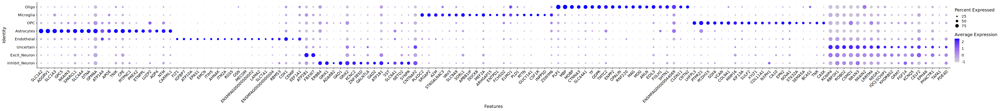

In [18]:
#classMarker = read_tsv(paste0(dataDir, "/allSnRNAseq.soupx.mergeSeuratFiltlibFilt800mt5Ratio1d2.downsample5000ClassMarker.20220822.tsv"))
classMarker = subset(classMarker, p_val_adj < 0.01 & avg_log2FC > 1)
table(classMarker$cluster)

classMarkerTop = classMarker %>% group_by(cluster) %>% top_n(n = 20, wt = avg_log2FC)
options(repr.plot.width=length(unique(classMarkerTop$gene))/3, repr.plot.height=5)
Idents(seurat) = "class"
DotPlot(seurat, features=unique(c(classMarkerTop$gene))) + RotatedAxis()


 num [1:7, 1:8] 4847 27 34 10 16 ...
 - attr(*, "dimnames")=List of 2
  ..$ : chr [1:7] "Astrocytes" "Endotheial" "Excit_Neuron" "Inhibit_Neuron" ...
  ..$ : chr [1:8] "Astrocytes" "Endotheial" "Excit_Neuron" "Inhibit_Neuron" ...


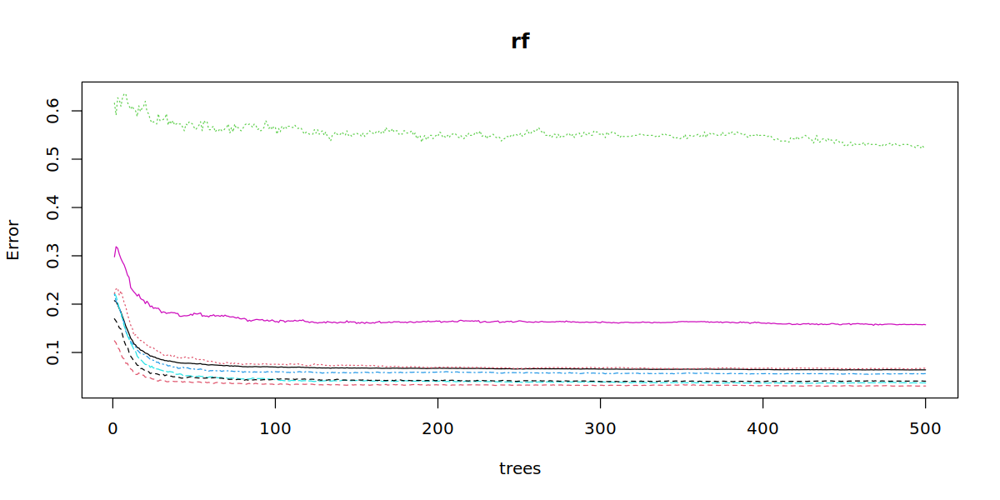

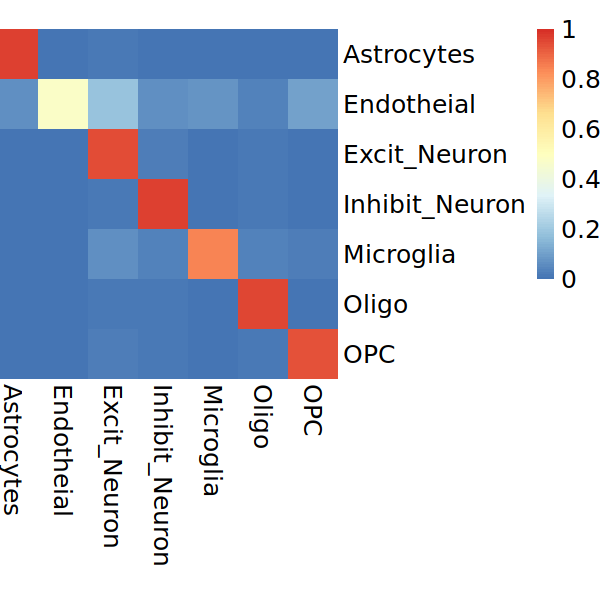

In [20]:
trainDf = as.data.frame(t(as.matrix(trainSeurat[["SCT"]]@data[unique(classMarker$gene), ])))
trainDf$class = trainSeurat$class
trainDf = subset(trainDf, class != "Uncertain")
trainDf$class = factor(trainDf$class)
# We need to modify the name of the columns
colnames(trainDf) = paste0("col_", colnames(trainDf))
colnames(trainDf) = gsub("-", "_", colnames(trainDf))

rf = randomForest(col_class~., data=trainDf, ntree=500)
#saveRDS(rf, paste0(dataDir, "/allSnRNAseq.soupx.mergeSeuratFiltlibFilt800mt5Ratio1d2.class.randomForest.20220822.rds"))

#rf = readRDS(paste0(dataDir, "/allSnRNAseq.soupx.mergeSeuratFiltlibFilt800mt5Ratio1d2.class.randomForest.20220822.rds"))
str(rf$confusion)
options(repr.plot.width=10, repr.plot.height=5)
plot(rf)

confusionRatio = t(apply(rf$confusion[1:7, 1:7], 1, function(x) {x/sum(x)}))
options(repr.plot.width=5, repr.plot.height=5)
pheatmap(confusionRatio, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15)


 'matrix' num [1:151539, 1:7] 0.03 0.018 0.006 0.026 0 0.002 0.04 0.038 0.012 0.072 ...
 - attr(*, "dimnames")=List of 2
  ..$ : chr [1:151539] "6121-1_CELL2857_N1" "6121-1_CELL916_N2" "6121-1_CELL2292_N1" "6121-1_CELL7278_N1" ...
  ..$ : chr [1:7] "Astrocytes" "Endotheial" "Excit_Neuron" "Inhibit_Neuron" ...


cellId,maxPredClassScore,maxPredClass
<chr>,<dbl>,<chr>
6121-1_CELL2857_N1,0.812,Inhibit_Neuron
6121-1_CELL916_N2,0.856,Excit_Neuron
6121-1_CELL2292_N1,0.930,Inhibit_Neuron
6121-1_CELL7278_N1,0.540,Excit_Neuron
6121-1_CELL1664_N1,0.984,Excit_Neuron
6121-1_CELL257_N3,0.918,Excit_Neuron


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.1840  0.5720  0.8300  0.7561  0.9540  1.0000 

[1] TRUE

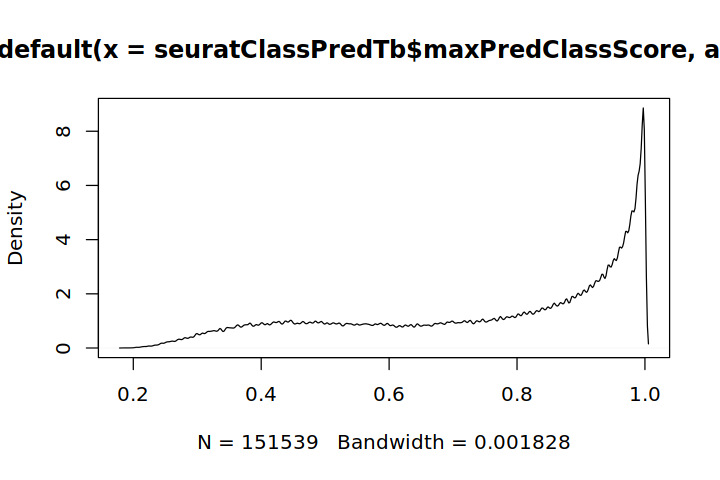

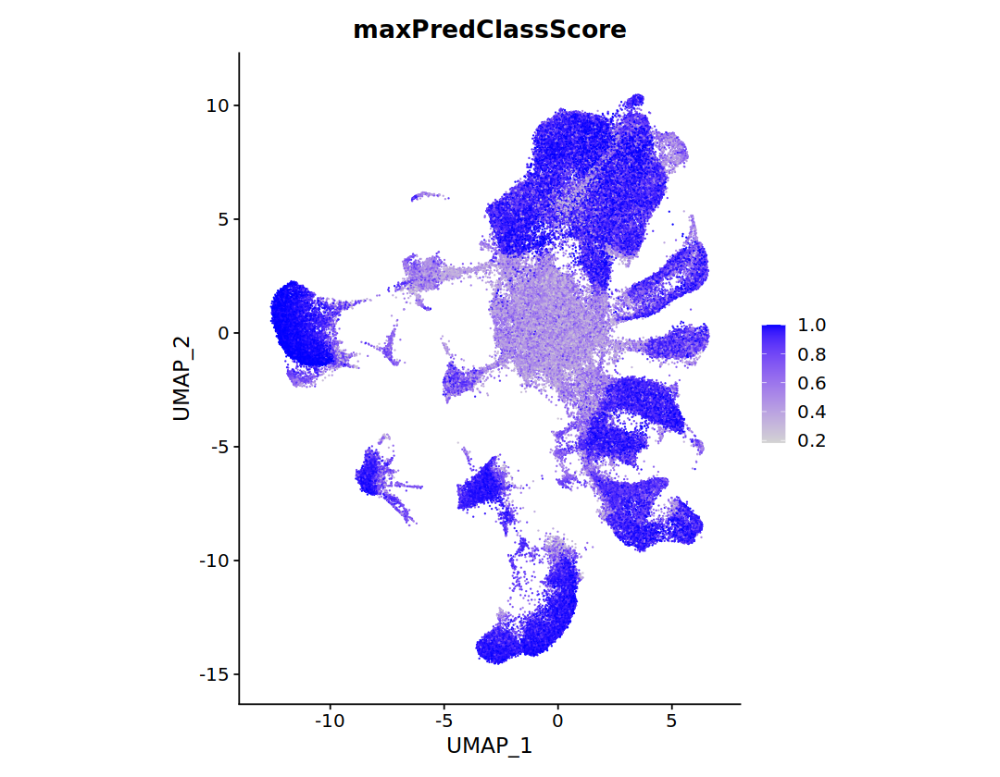

In [22]:
# Apply the trainer to filter cells
seuratCountDf = as.data.frame(t(as.matrix(seurat[["SCT"]]@data[unique(classMarker$gene), ])))
colnames(seuratCountDf) = paste0("col_", colnames(seuratCountDf))
colnames(seuratCountDf) = gsub("-", "_", colnames(seuratCountDf))
seuratClassPred = predict(rf, seuratCountDf, type="prob")
str(seuratClassPred)

seuratClassPredTb = tibble(
    cellId = rownames(seuratClassPred),
    maxPredClassScore = apply(seuratClassPred, 1, max),
    maxPredClass = apply(seuratClassPred, 1, function(x) {names(x)[which.max(x)]})
)
head(seuratClassPredTb)

summary(seuratClassPredTb$maxPredClassScore)
options(repr.plot.width=6, repr.plot.height=4)
plot(density(seuratClassPredTb$maxPredClassScore, adjust=0.1))

identical(seuratClassPredTb$cellId, rownames(seurat@meta.data))
tmpDf = as.data.frame(seuratClassPredTb[c("maxPredClassScore", "maxPredClass")])
rownames(tmpDf) = seuratClassPredTb$cellId

seurat = AddMetaData(seurat, tmpDf)

options(repr.plot.width=9, repr.plot.height=7)
FeaturePlot(seurat, reduction="umap", features="maxPredClassScore",raster=FALSE)+coord_fixed()


In [23]:
# Filter class outliers
# Removed clusters classified with ambiguous labels
# Removed cells classified with a different label from the majority of cells in its clusters
# Removed outliers when clustering, typically on the fringes of clusters in U-map space

Idents(seurat) = "seurat_clusters"
cellNum0 = ncol(seurat)
classFiltSeurat = subset(seurat, maxPredClassScore >= 0.8)
cellNum1 = ncol(classFiltSeurat)
message("Filt cell ratio: ", cellNum1/cellNum0)


Filt cell ratio: 0.539953411333056



In [24]:
classFiltSeurat

An object of class Seurat 
45543 features across 81824 samples within 2 assays 
Active assay: SCT (22313 features, 5000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

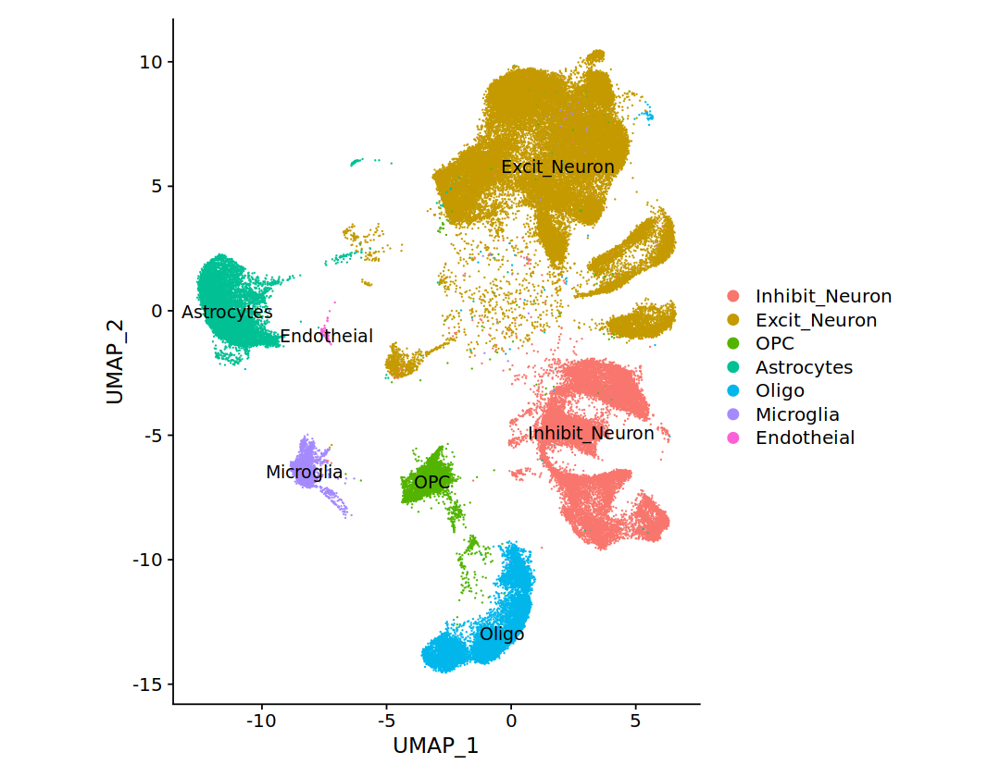

In [25]:
Idents(classFiltSeurat) = "maxPredClass"
options(repr.plot.width=9, repr.plot.height=7)
DimPlot(classFiltSeurat, reduction="umap", label=T,raster=FALSE)+coord_fixed()

Joining, by = c("renew_type", "cell")


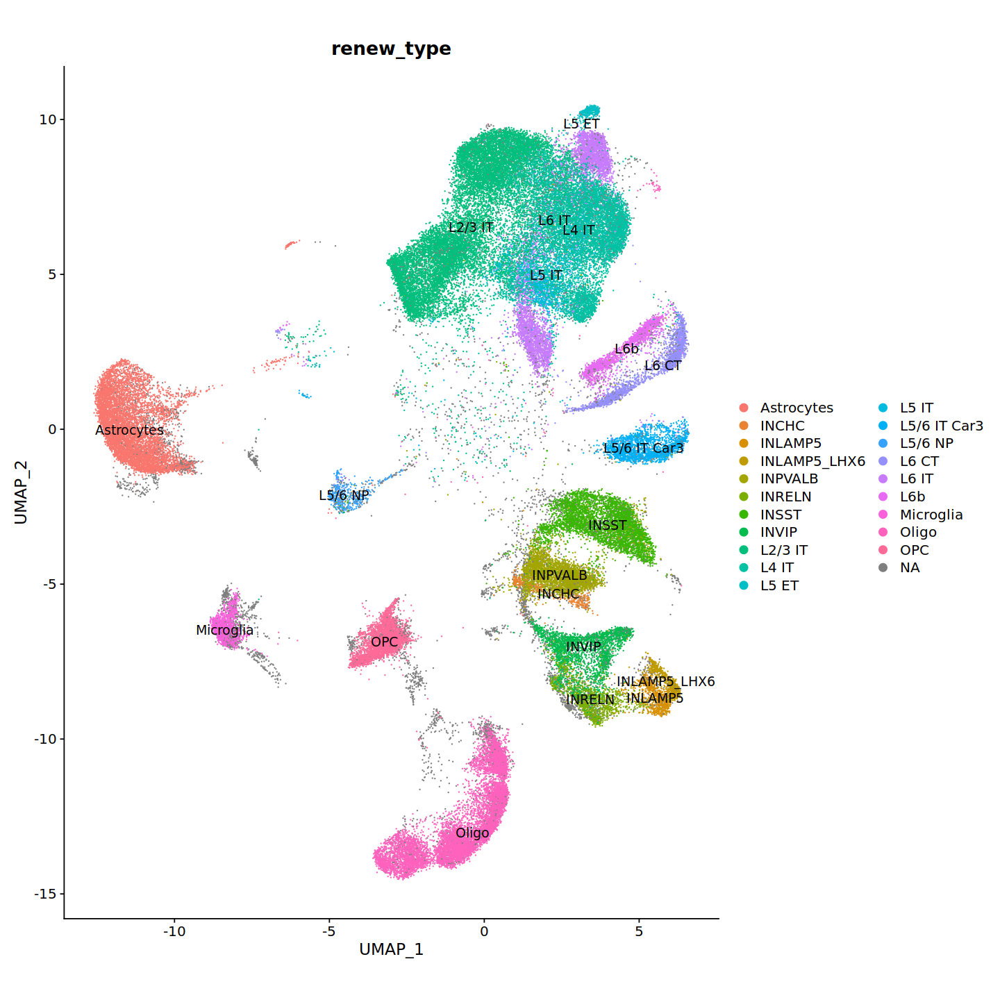

In [26]:
df=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/ref_insu.csv')

ref=classFiltSeurat@meta.data
ref$cell=rownames(ref)
ref=left_join(ref,df)
classFiltSeurat=AddMetaData(classFiltSeurat,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(classFiltSeurat,group.by = 'renew_type',label=T,raster=FALSE)+coord_fixed()



In [ ]:
Idents(seurat) = "group"
options(repr.plot.width=15, repr.plot.height=20)
print(plot_grid(
    plotlist = lapply(c("nCount_RNA", "nFeature_RNA"), function(x) {
        p = VlnPlot(seurat, features=x, pt.size=0) + 
            theme(axis.text.x=element_text(vjust=0.5, hjust=0.5, angle=90), axis.title.x = element_blank()) +
            guides(fill=FALSE)
        return(p)
    }), 
    ncol=1, align="hv", axis="tblr"
))

In [27]:
#EXIN按照nfeature800过滤
df_fil=classFiltSeurat@meta.data
EX_cell=rownames(df_fil[df_fil$nFeature_RNA > 800 & df_fil$maxPredClass=='Excit_Neuron',])
IN_cell=rownames(df_fil[df_fil$nFeature_RNA > 800 & df_fil$maxPredClass=='Inhibit_Neuron',])
Other_cell=rownames(df_fil[df_fil$maxPredClass %in% setdiff(unique(df_fil$maxPredClass),c('Excit_Neuron','Inhibit_Neuron')),])
fil_cell=c(EX_cell,IN_cell,Other_cell)

classFiltSeurat1=subset(classFiltSeurat,cells = fil_cell)

classFiltSeurat1


An object of class Seurat 
45543 features across 80194 samples within 2 assays 
Active assay: SCT (22313 features, 5000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

Joining, by = c("renew_type", "cell")


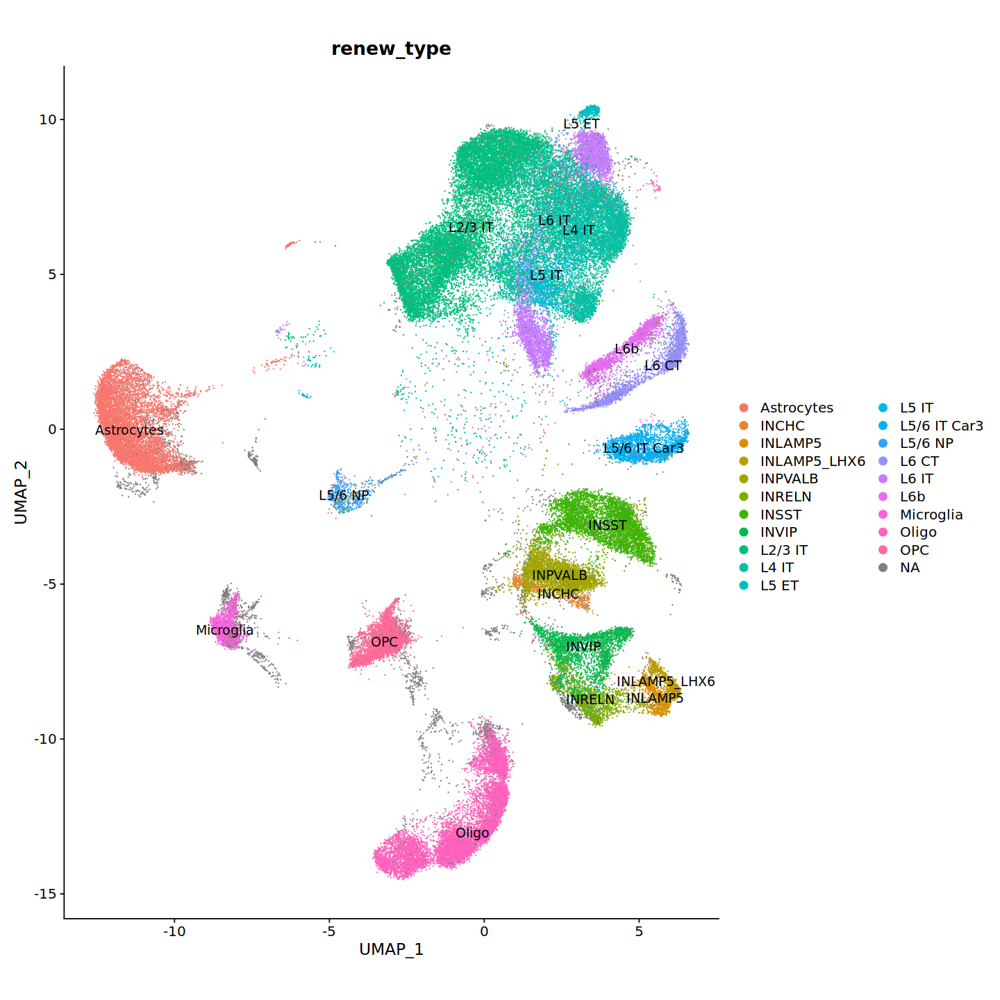

In [28]:
df=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/ref_insu.csv')
test=classFiltSeurat1
ref=test@meta.data
ref$cell=rownames(ref)
ref=left_join(ref,df)
test=AddMetaData(test,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(test,group.by = 'renew_type',label=T)+coord_fixed()


In [29]:
table(test$renew_type)


  Astrocytes        INCHC      INLAMP5 INLAMP5_LHX6      INPVALB       INRELN 
        7272          346          720          610         3714         1287 
       INSST        INVIP      L2/3 IT        L4 IT        L5 ET        L5 IT 
        4376         2424        15204         9251          657         1435 
L5/6 IT Car3      L5/6 NP        L6 CT        L6 IT          L6b    Microglia 
        2032          412         2321         4704         1768         1508 
       Oligo          OPC 
        9797         3463 

In [30]:
saveRDS(classFiltSeurat,'/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/insular_snrna_all_soupX_fil300_800_anno_SCT_RFfil_240116.rds')


Centering and scaling data matrix

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony converged after 6 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.SCT.harmony; see ?make.names for more details on syntax validity”
Computing nearest neighbor graph

Computing SNN

20:55:47 UMAP embedding parameters a = 0.9922 b = 1.112

20:55:47 Read 81055 rows and found 30 numeric columns

20:55:47 Using Annoy for neighbor search, n_neighbors = 30

20:55:47 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

20:56:02 Writing NN index file to temp file /tmp/RtmpPUDy1w/file1ec153447c63e

20:56:02 Searching Annoy index using 1 thread, search_k = 3000

20:56:40 Annoy r

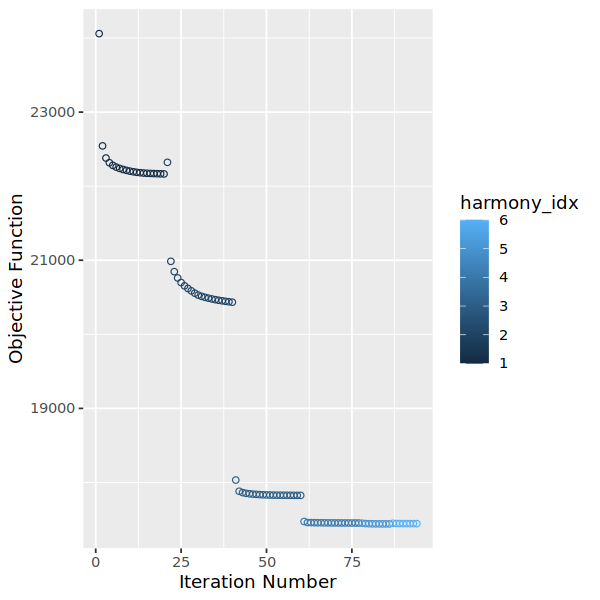

In [81]:
classFiltSeurat =  NormalizeData(classFiltSeurat, normalization.method = "LogNormalize", scale.factor = 10000)
classFiltSeurat = FindVariableFeatures(classFiltSeurat, selection.method = "vst", nfeatures = nrow(classFiltSeurat))
classFiltSeurat = ScaleData(classFiltSeurat, features = rownames(classFiltSeurat))


classFiltSeurat = RunHarmony(
    classFiltSeurat, group.by.vars="sample", plot_convergence=T, 
    reduction = "pca", dims.use=1:30,
    theta=2,)
classFiltSeurat = classFiltSeurat %>% 
    FindNeighbors(reduction="harmony", dims = 1:30) %>%
    FindClusters(verbose = FALSE) %>%
    RunUMAP(reduction="harmony", dims = 1:30)

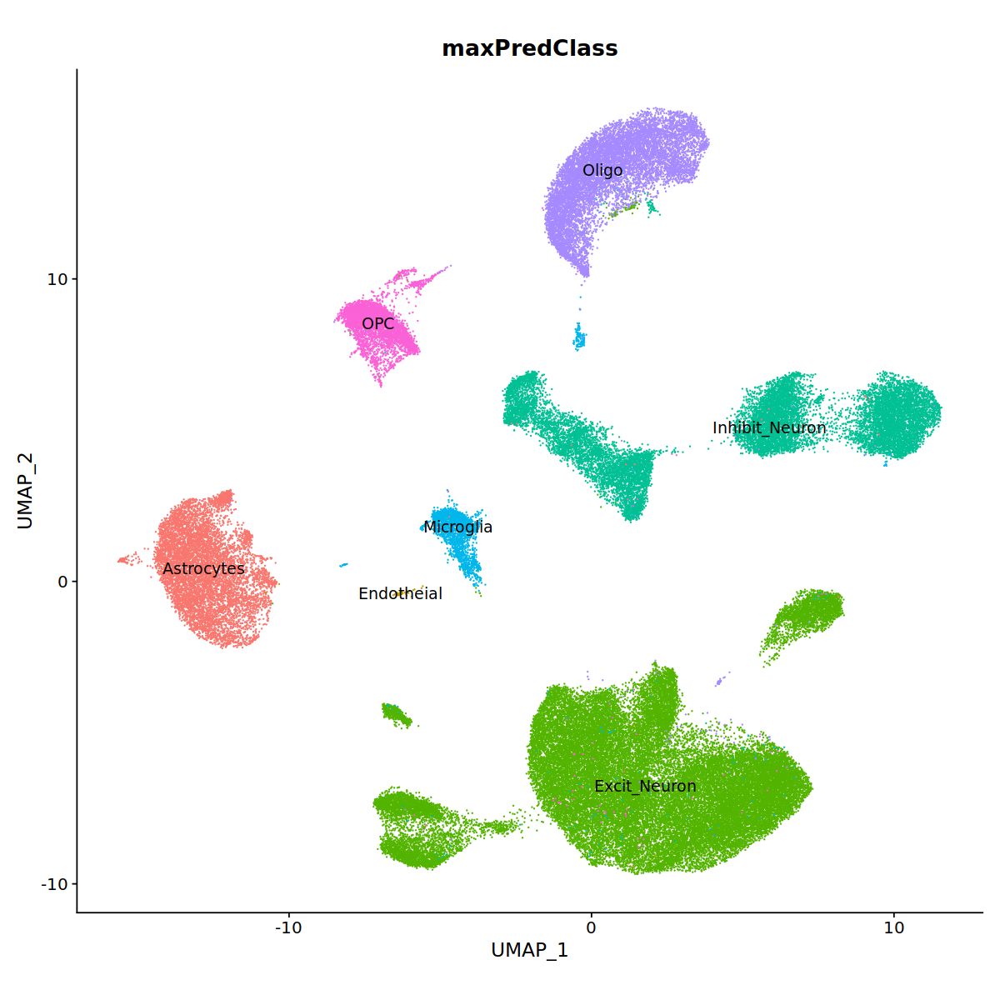

In [83]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat,group.by = 'maxPredClass',label=T,raster=FALSE)+coord_fixed()+NoLegend()




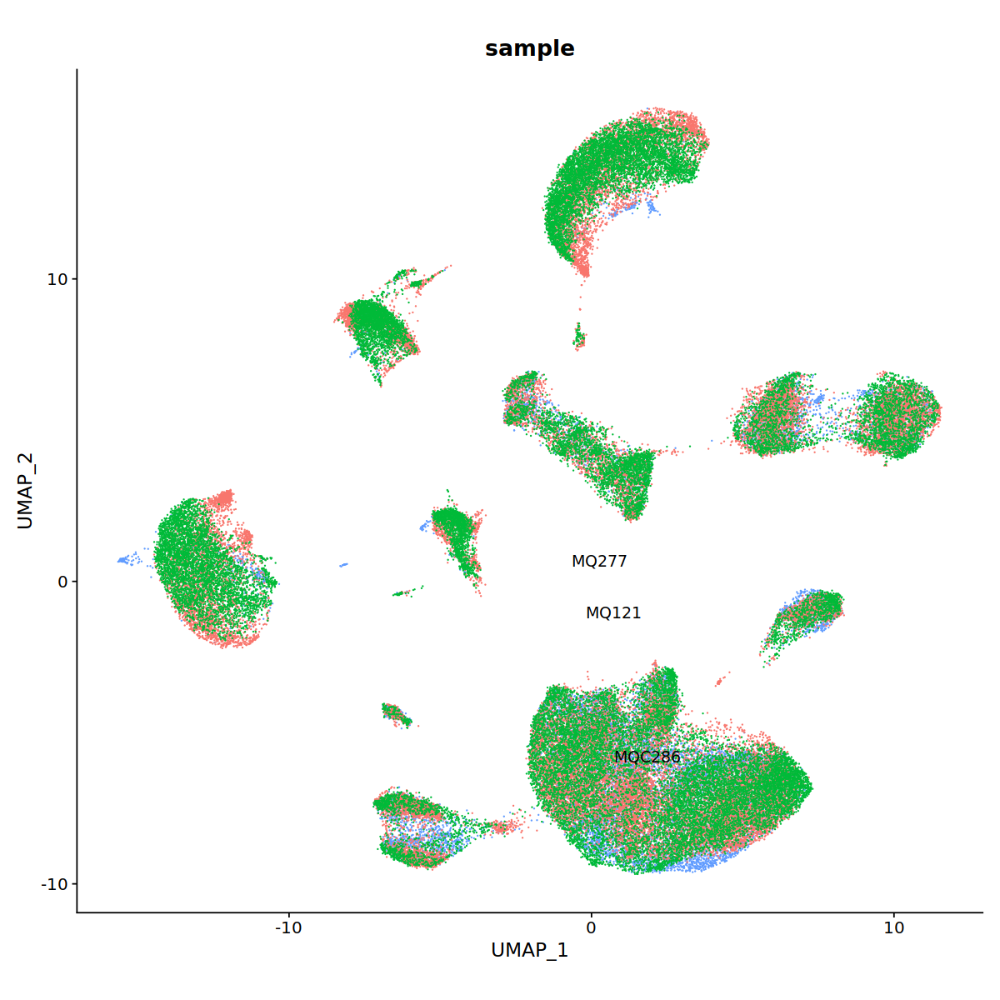

In [82]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(classFiltSeurat,group.by = 'sample',label=T,raster=FALSE)+coord_fixed()+NoLegend()


In [84]:
get_anno=function(area,marker_num){
    area$Cluster=area$seurat_clusters
    cortex=area
    marker=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/macaca/sn_0821_renew_batch3_all/batch_normalize_renew_1031/dif_res_anno1/train_seurat/train_res1.1_res0.9_res0.15_downsample3000_supercluster_marker.csv')
    sel_type=setdiff(unique(marker$cluster),unique(marker$cluster)[grep('EX',unique(marker$cluster))])
    marker1=marker[marker$cluster %in% sel_type,]

    marker=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/dif_res_anno/marker_Compare.csv')
    all_n=unique(marker$cluster)
    sel=all_n[grep('L[0-9]',all_n)]
    marker2=marker[marker$cluster %in% sel,]

    marker1=marker1[,c('cluster','gene','avg_log2FC','p_val_adj')]
    marker2=marker2[,c('cluster','gene','avg_log2FC','p_val_adj')]
    marker=rbind(marker1,marker2)
    marker=marker[marker$cluster %in% setdiff(unique(marker$cluster),c('OPC','MSN','Endotheial','Microglia',
                                                                      'Astrocytes','Oligo')),]
    marker$renew_name=paste0(marker$cluster,'_',marker$gene)
    marker=marker[!duplicated(marker$renew_name),]

    sort_marker=marker %>% group_by(cluster) %>% top_n(n=marker_num,wt=avg_log2FC)
    sort_marker1=sort_marker[,c('cluster','gene')]
    sort_marker1=as.data.frame(sort_marker1)
    sort_marker1=sort_marker1[order(sort_marker1$cluster),]
    dotplot_genes=sort_marker$gene
    dotplot_genes=intersect(dotplot_genes,rownames(cortex[["SCT"]]@data))
    sort_marker1=sort_marker1[sort_marker1$gene %in% dotplot_genes,]
    sort_marker1=sort_marker1[!duplicated(sort_marker1$gene),]
    dotplot_genes=sort_marker1$gene




    sel_gene=dotplot_genes
    cla=cortex
    df_ref=cortex@meta.data[,'Cluster',drop=F]
    df_ref$cellID=rownames(df_ref)


    df=cla@assays$SCT@counts[sel_gene,]
    df=as.data.frame(t(df))
    df$cellID=rownames(df)

    df=left_join(df,df_ref)
    df$cellID=NULL

    df_re=split(df,df$Cluster)

    i=1
    df_re[[i]]$Cluster=NULL
    df_sub=as.data.frame(apply(df_re[[i]],2,mean))
    colnames(df_sub)=names(df_re)[i]
    df_sum=df_sub
    for(i in c(2:length(names(df_re)))){df_re[[i]]$Cluster=NULL
    df_sub=as.data.frame(apply(df_re[[i]],2,mean))
    colnames(df_sub)=names(df_re)[i]
    df_sum=cbind(df_sum,df_sub)}

    sel=rownames(df_sum)[apply(df_sum,1,sum)==0]
    other=setdiff(rownames(df_sum),sel)
    df_sum=df_sum[other,]

    #df_sum=df_sum[df_sum$EX_VENO>2,]
    df_sum_renew=apply(df_sum,1,function(f){
        f/max(f)
    })
    reorder_matrix <- function(matrix1, by.rows = TRUE) {
      if (by.rows == TRUE) {
        conf.order <- order(apply(matrix1, 1, which.max))
        matrix1.reordered <- matrix1[conf.order, ]
      } else {
        conf.order <- order(apply(matrix1, 2, which.max))
        matrix1.reordered <- matrix1[, conf.order]
      }
    }

    df_sum_renew1 = reorder_matrix(df_sum_renew, by.rows=F)

    #options(repr.plot.width=80, repr.plot.height=30)
    #pheatmap(df_sum_renew1
    #, breaks=seq(0,1,0.01), cluster_rows=F, cluster_cols=F, border_color=NA, cellwidth=30, cellheight=30, fontsize=15,
    #        color = viridis(100),display_numbers = T )

    rownames(sort_marker1)=sort_marker1$gene
    sort_marker1$rename=paste0(sort_marker1$cluster,'_',sort_marker1$gene)
    df_sum_renew2=df_sum_renew1
    colnames(df_sum_renew2)=sort_marker1[colnames(df_sum_renew1),]$rename
    #sel1=sort_marker1[grep('L[0-9].*',sort_marker1$cluster),]$rename

    sel1=sort_marker1$rename
    as=sel1[grep('Astro',sel1)]
    as1=sel1[grep('Oligo',sel1)]
    sel1=setdiff(sel1,c(as,as1))
    sel2=rownames(df_sum_renew2)[grep('Excit',rownames(df_sum_renew2))]
    df_sum_renew3=df_sum_renew2[,intersect(colnames(df_sum_renew2),sel1)]
    df_sum_renew3=t(df_sum_renew3)



    df_sum_renew3=df_sum_renew3[order(rownames(df_sum_renew3)),]

    df_sum_renew4 = reorder_matrix(df_sum_renew3,by.rows = F)
    options(repr.plot.width=30, repr.plot.height=40)

    name=str_extract(rownames(df_sum_renew4),'.*_')
    name=gsub('_','',name)
    df_sum_renew4=as.data.frame(df_sum_renew4)
    df_sum_renew4$reorder=name
    df_sum_renew4_list=split(df_sum_renew4,df_sum_renew4$reorder)

    aba_all=data.frame()
    df=df_sum_renew4_list[[1]]
    df=as.data.frame(df)
    df$reorder=NULL
    aba=apply(df,2,mean)
    aba_all=rbind(aba_all,aba)
    colnames(aba_all)=names(aba)

    for(i in c(2:length(df_sum_renew4_list))){
        df=df_sum_renew4_list[[i]]
        df=as.data.frame(df)
        df$reorder=NULL
        aba=apply(df,2,mean)
        aba_all=rbind(aba_all,aba)

    }

    rownames(aba_all)=names(df_sum_renew4_list)

    df_sum=data.frame()
    for(i in c(1:ncol(aba_all))){
        cell=colnames(aba_all)[i]
        type=rownames(aba_all)[aba_all[,i]==max(aba_all[,i])]
        df_sum=rbind(df_sum,c(cell,type))
        }
    return(df_sum)
}

Joining, by = "cellID"
Joining, by = "Subclass"


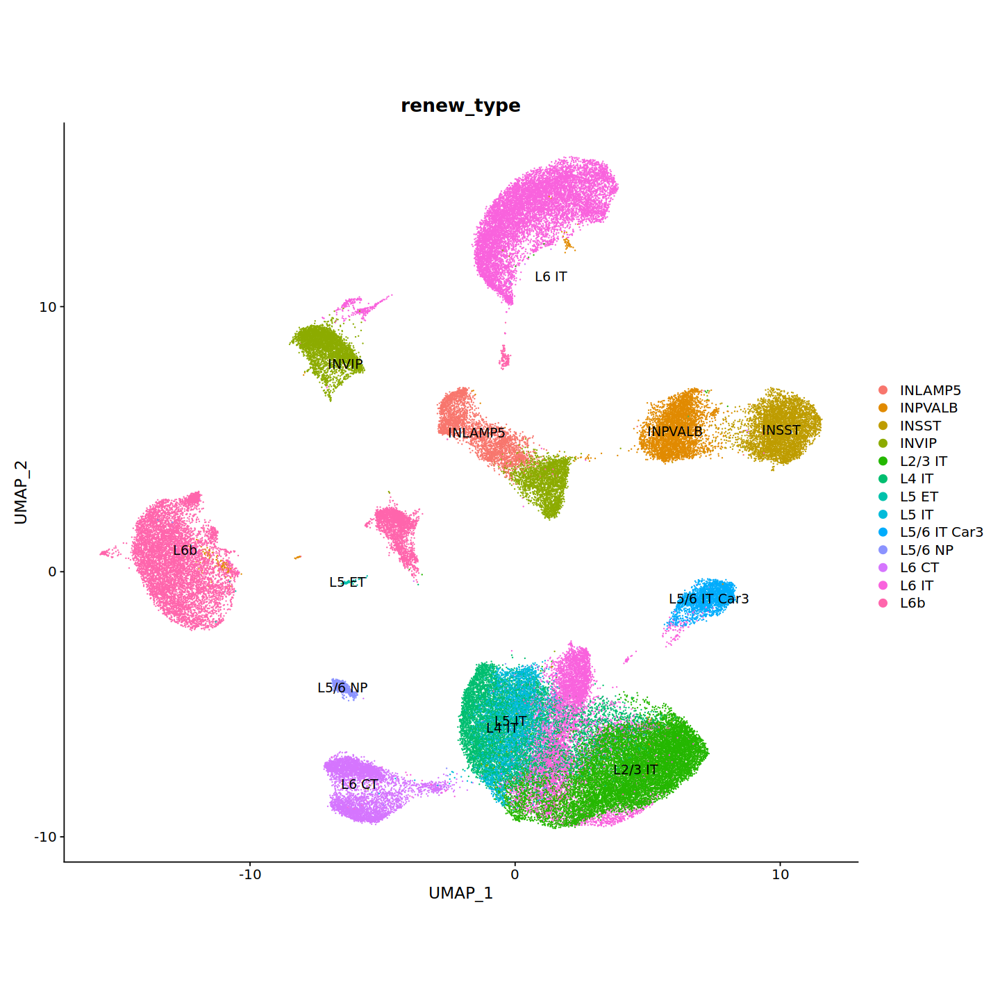

In [86]:
#Insular重新整理(带layer)
insu=classFiltSeurat
insu$Subclass=insu$seurat_clusters
df_sum=get_anno(insu,20)
colnames(df_sum)=c('Subclass','renew_type')


#df_sum[df_sum$Subclass %in% c('Inhibit_Neuron_15'),]$renew_type='INSST'
#df_sum[df_sum$Subclass %in% c('Inhibit_Neuron_7'),]$renew_type='INLAMP5_LHX6'
#df_sum[df_sum$Subclass %in% c('Excit_Neuron_11'),]$renew_type='L6b'
#df_sum[df_sum$Subclass %in% c('Excit_Neuron_16'),]$renew_type='L5 ET'



area=insu
ref=area@meta.data[,'Subclass',drop=F]
ref$ID=rownames(ref)
colnames(df_sum)=c('Subclass','renew_type')
ref=left_join(ref,df_sum)
area=AddMetaData(area,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(area,group.by = 'renew_type',label=T)+coord_fixed()



Joining, by = c("renew_type", "cell")


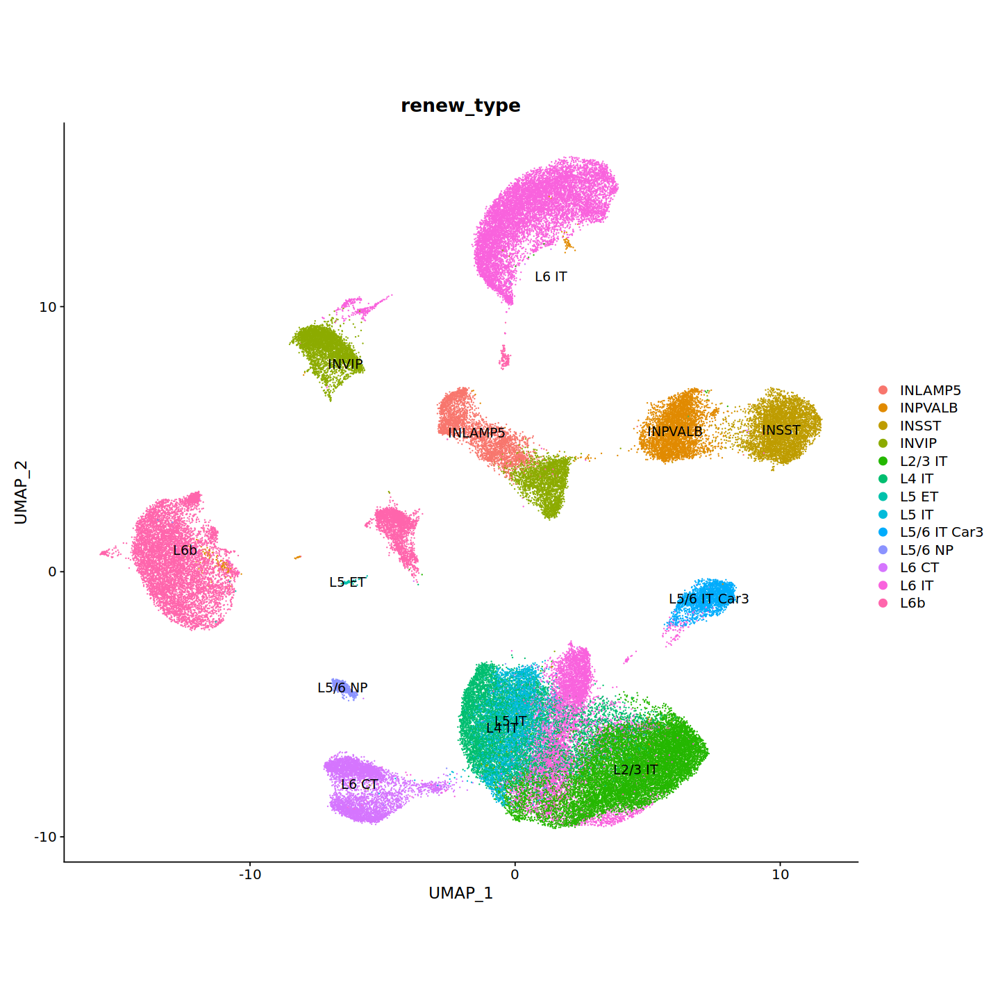

In [90]:
df=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/ref_insu.csv')

ref=area@meta.data
ref$cell=rownames(ref)
ref=left_join(ref,df)
area=AddMetaData(area,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(area,group.by = 'renew_type',label=T)+coord_fixed()



In [80]:
saveRDS(classFiltSeurat,'/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/insular_snrna_all_soupX_fil300_800_anno_SCT_RFfil_240116.rds')



In [1]:
test=readRDS('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/insular_snrna_all_soupX_fil300_800_anno_SCT_RFfil_240116.rds')



Joining, by = c("renew_type", "cell")


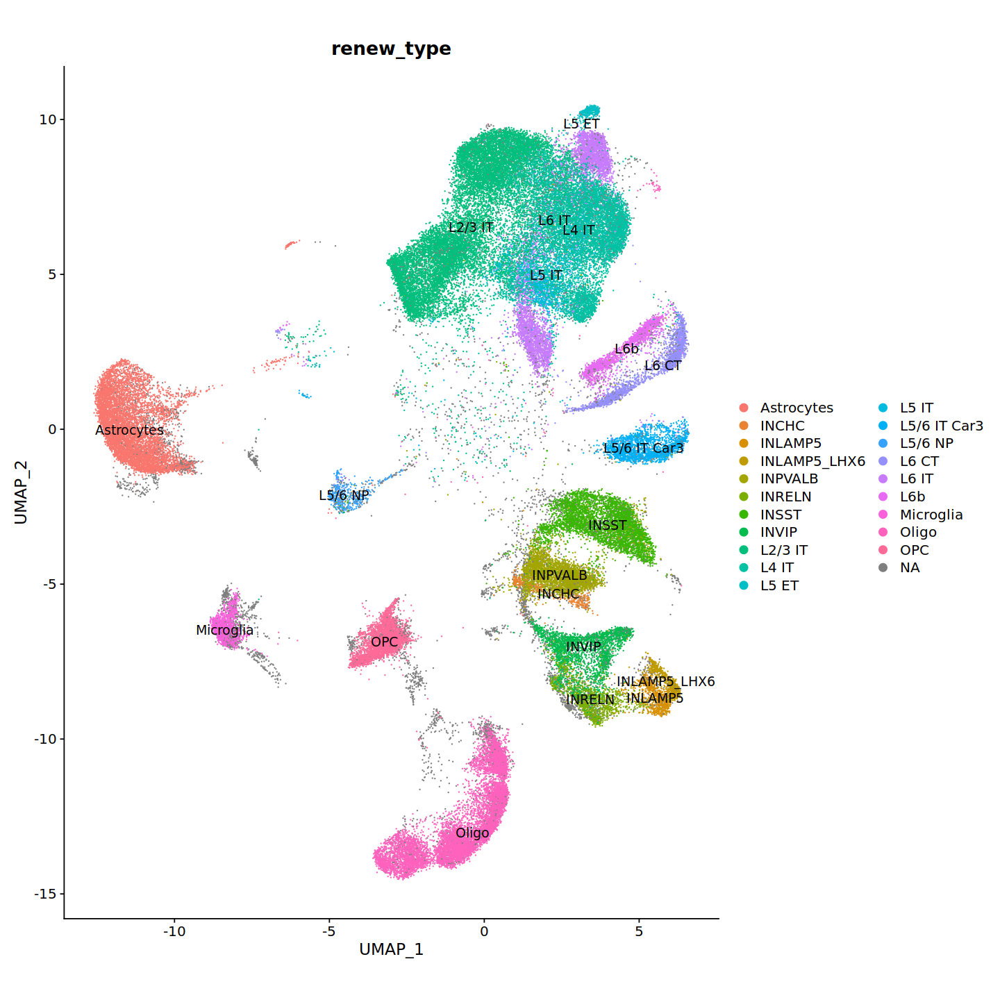

In [4]:
df=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/ref_insu.csv')

ref=test@meta.data
ref$cell=rownames(ref)
ref=left_join(ref,df)
test=AddMetaData(test,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(test,group.by = 'renew_type',label=T)+coord_fixed()


In [7]:
test

An object of class Seurat 
45543 features across 81824 samples within 2 assays 
Active assay: SCT (22313 features, 5000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

In [5]:
#EXIN按照nfeature800过滤
classFiltSeurat=test
df_fil=classFiltSeurat@meta.data
EX_cell=rownames(df_fil[df_fil$nFeature_RNA > 800 & df_fil$maxPredClass=='Excit_Neuron',])
IN_cell=rownames(df_fil[df_fil$nFeature_RNA > 800 & df_fil$maxPredClass=='Inhibit_Neuron',])
Other_cell=rownames(df_fil[df_fil$maxPredClass %in% setdiff(unique(df_fil$maxPredClass),c('Excit_Neuron','Inhibit_Neuron')),])
fil_cell=c(EX_cell,IN_cell,Other_cell)

classFiltSeurat1=subset(classFiltSeurat,cells = fil_cell)

classFiltSeurat1


An object of class Seurat 
45543 features across 80194 samples within 2 assays 
Active assay: SCT (22313 features, 5000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

Joining, by = "cell"


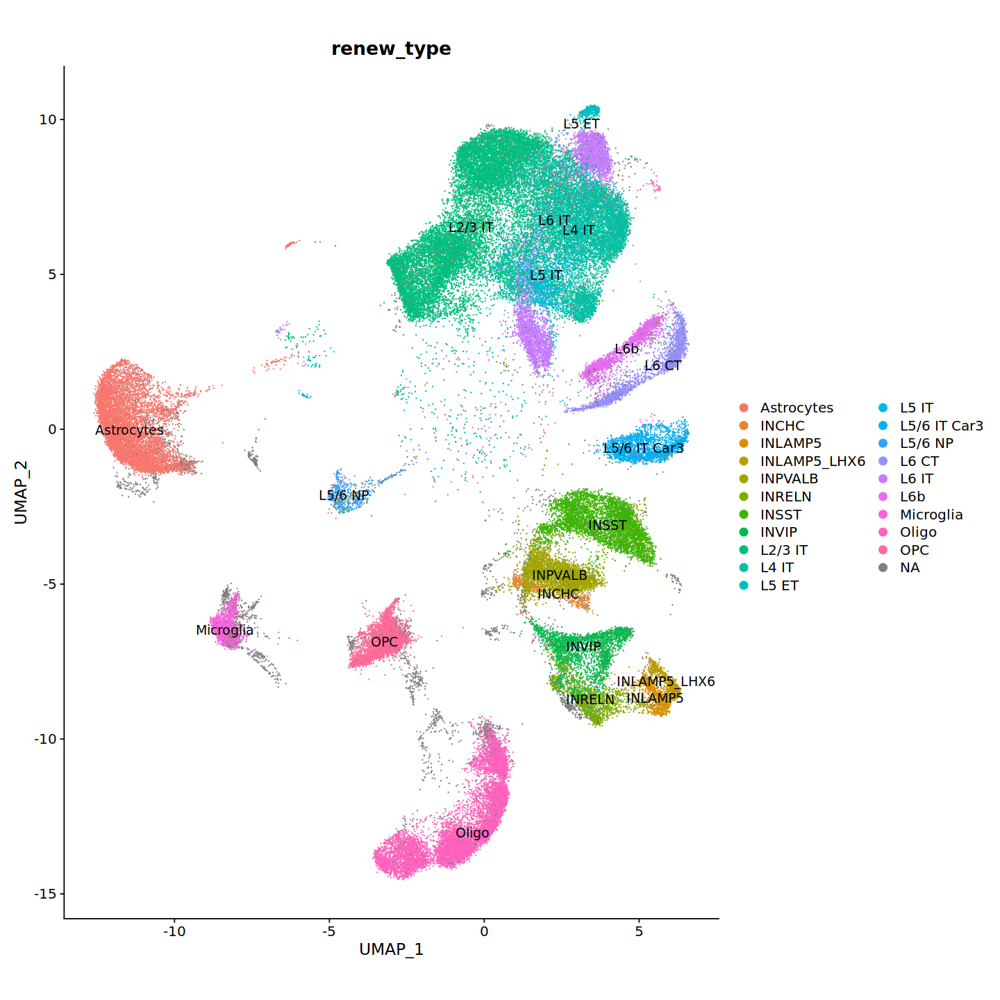

In [9]:
df=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/ref_insu.csv')

ref=classFiltSeurat1@meta.data
ref$renew_type=NULL
ref$cell=rownames(ref)
ref=left_join(ref,df)
classFiltSeurat1=AddMetaData(classFiltSeurat1,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(classFiltSeurat1,group.by = 'renew_type',label=T)+coord_fixed()


In [ ]:
saveRDS(classFiltSeurat1,'/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/insular_snrna_all_soupX_fil300_800_anno_SCT_RFfil_240116.rds')




Joining, by = "cell"


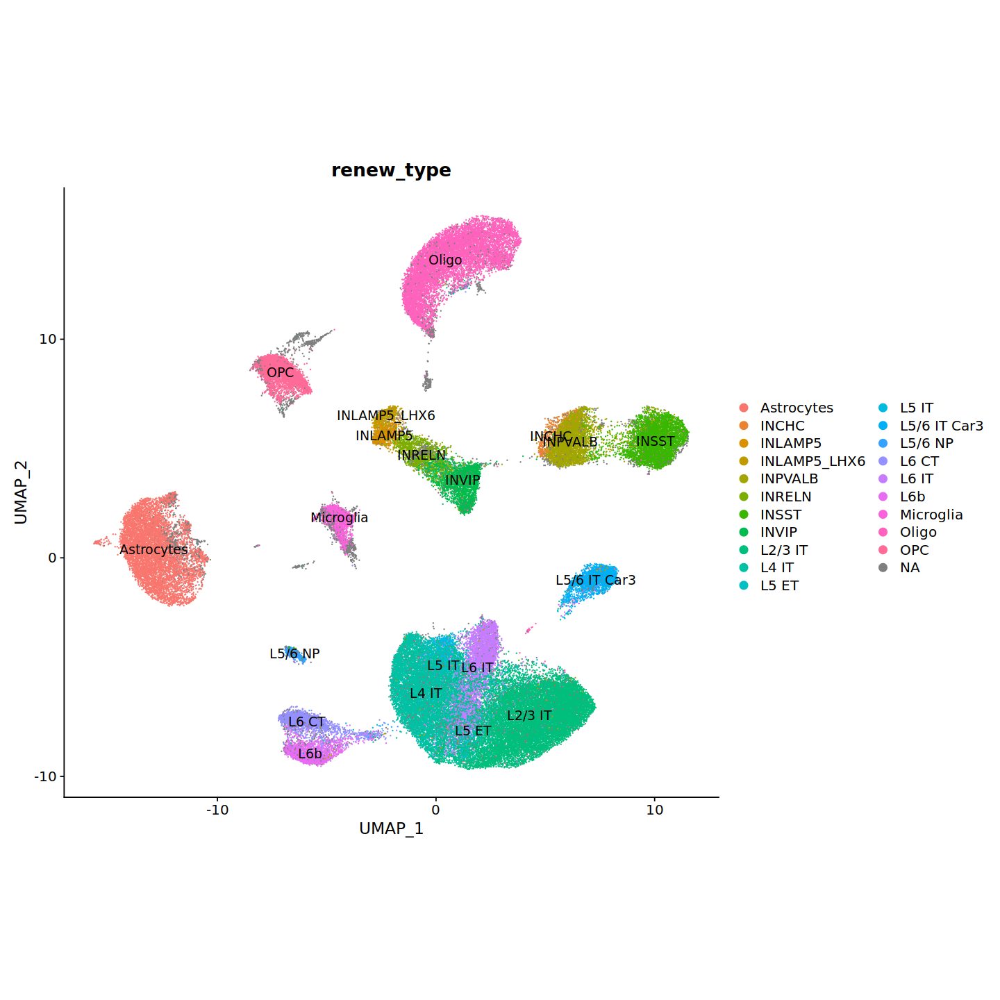

In [105]:
df=read.csv('/home/liuyx/liuyuxuan/spa_seurat/cla/speciesCompare/Insular_renew_1016/batch_normalize_renew_240115/dif_res_anno/ref_insu.csv')
#insu$renew_type=NULL
ref=insu@meta.data
ref$cell=rownames(ref)
ref=left_join(ref,df)
insu=AddMetaData(insu,ref$renew_type,col.name = 'renew_type')

options(repr.plot.width=12, repr.plot.height=12)
DimPlot(insu,group.by = 'renew_type',label=T)+coord_fixed()


In [ ]:
table(classFiltSeurat$maxPredClass)

In [ ]:
Excit=subset(classFiltSeurat,maxPredClass=='Excit_Neuron')
Inhibit=subset(classFiltSeurat,maxPredClass=='Inhibit_Neuron')
Astrocytes=subset(classFiltSeurat,maxPredClass=='Astrocytes')
Oligo=subset(classFiltSeurat,maxPredClass=='Oligo')
Microglia=subset(classFiltSeurat,maxPredClass=='Microglia')
OPC=subset(classFiltSeurat,maxPredClass=='OPC')
#MSN=subset(classFiltSeurat,maxPredClass=='MSN')
#VLMC=subset(classFiltSeurat,maxPredClass=='VLMC')
Endotheial=subset(classFiltSeurat,maxPredClass=='Endotheial')
